# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [3]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:10<00:00, 5.86KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

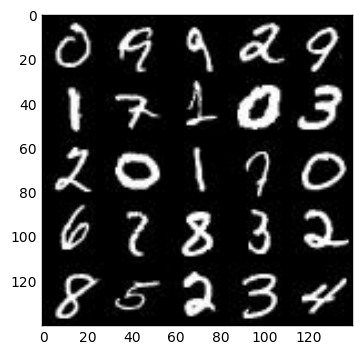

In [5]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

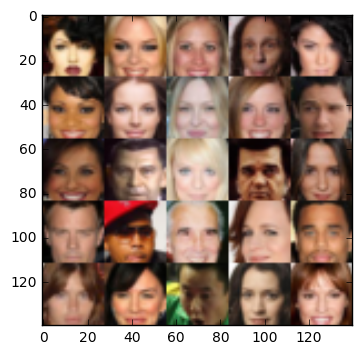

In [6]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [7]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [124]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    input_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return input_real, input_z, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [50]:


def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    ALPHA = 0.1
    with tf.variable_scope('discriminator', reuse=reuse):
        # 28x28x3 => 14x14x16
        conv1 = tf.layers.conv2d(images, 16, 4, strides=2, padding='same')
        leaky_relu1 = tf.maximum(ALPHA * conv1, conv1)
        
        # 28x28x3 => 7x7x64
        conv2 = tf.layers.conv2d(leaky_relu1, 64, 4, strides=2, padding='same')
        norm2 = tf.layers.batch_normalization(conv2, training=True)
        leaky_relu2 = tf.maximum(ALPHA * norm2, norm2)
        
        # 7x7x64 => 4x4x256
        conv3 = tf.layers.conv2d(leaky_relu2, 256, 4, strides=2, padding='same')
        norm3 = tf.layers.batch_normalization(conv3, training=True)
        leaky_relu3 = tf.maximum(ALPHA * norm3, norm3)
        
        flatten = tf.reshape(leaky_relu3, (-1, 4 * 4 * 256))
        logits = tf.layers.dense(flatten, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [101]:


def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    ALPHA = 0.1
    reuse = not is_train
    with tf.variable_scope('generator', reuse=reuse):
        # from z to image shape (2x2x512)
        dense1 = tf.layers.dense(z, 2 * 2 * 512)
        image_shape1 = tf.reshape(dense1, (-1, 2, 2, 512))
        leaky_relu1 = tf.maximum(ALPHA * image_shape1, image_shape1)
        
        # 2x2x512 => 4x4x256
        deconv2 = tf.layers.conv2d_transpose(leaky_relu1, 256, 4, strides=2, padding='valid')
        norm2 = tf.layers.batch_normalization(deconv2, training=is_train)
        leaky_relu2 = tf.maximum(ALPHA * norm2, norm2)
        
        # 4x4x256 => 8x8x128
        deconv3 = tf.layers.conv2d_transpose(leaky_relu2, 128, 4, strides=2, padding='valid')
        norm3 = tf.layers.batch_normalization(deconv3, training=is_train)
        leaky_relu3 = tf.maximum(ALPHA * norm3, norm3)
        
        logits = tf.layers.conv2d_transpose(leaky_relu3, out_channel_dim, 4, strides=2, padding='same')
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [100]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    # Generate fake input
    input_fake = generator(input_z, out_channel_dim, is_train=True)
    
    d_real, logits_real = discriminator(input_real, reuse=False)
    d_fake, logits_fake = discriminator(input_fake, reuse=True)
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=logits_fake,
            labels=tf.zeros_like(d_fake),
        )
    )
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=logits_real,
            labels=tf.ones_like(d_real),
        )
    )
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=logits_fake,
            labels=tf.ones_like(d_fake),
        )
    )
    
    d_loss_total = d_loss_real + d_loss_fake
    
    return d_loss_total, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

(?, 100)
Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [111]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    
    d_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    g_train_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [61]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [128]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    SHOW_IMAGES_STEPS = 100
    PRINT_STEPS = 20
    current_step = 0
    
    N_SAMPLES, IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_DEPTH = data_shape
    input_real, input_z, lr = model_inputs(IMAGE_WIDTH, IMAGE_HEIGHT, IMAGE_DEPTH, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, IMAGE_DEPTH)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                batch_images *= 2
                
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={
                        input_real: batch_images, 
                        input_z: batch_z, 
                        lr: learning_rate
                    })
                _ = sess.run(g_train_opt, feed_dict={
                        input_real: batch_images, 
                        input_z: batch_z, 
                        lr: learning_rate
                    })
                
                if not current_step % PRINT_STEPS:
                    train_loss_d = d_loss.eval({
                            input_real: batch_images, 
                            input_z: batch_z
                        })
                    train_loss_g = g_loss.eval({
                            input_z: batch_z
                        })
                    
                    print("Epoch {}/{}...".format(epoch_i, epoch_count),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))    
                    
                if not current_step % SHOW_IMAGES_STEPS:
                    show_generator_output(sess, 36, input_z, IMAGE_DEPTH, data_image_mode)
                    
                current_step += 1
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 0/2... Discriminator Loss: 4.0768... Generator Loss: 0.0315


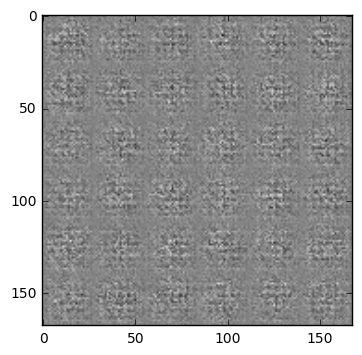

Epoch 0/2... Discriminator Loss: 1.5130... Generator Loss: 0.3871
Epoch 0/2... Discriminator Loss: 0.6726... Generator Loss: 1.0599
Epoch 0/2... Discriminator Loss: 0.4656... Generator Loss: 1.2705
Epoch 0/2... Discriminator Loss: 0.3166... Generator Loss: 1.7378
Epoch 0/2... Discriminator Loss: 0.6794... Generator Loss: 1.3203


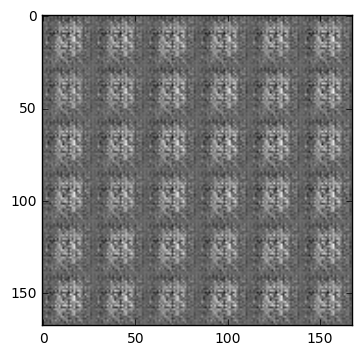

Epoch 0/2... Discriminator Loss: 1.0832... Generator Loss: 0.8267
Epoch 0/2... Discriminator Loss: 0.9050... Generator Loss: 1.1742
Epoch 0/2... Discriminator Loss: 0.6959... Generator Loss: 1.3049
Epoch 0/2... Discriminator Loss: 0.7085... Generator Loss: 1.2135
Epoch 0/2... Discriminator Loss: 0.7489... Generator Loss: 1.2210


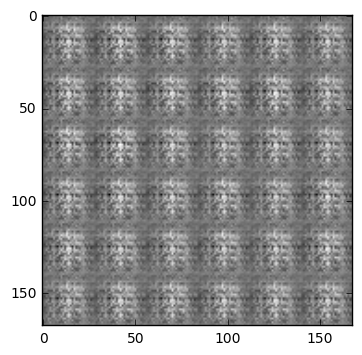

Epoch 0/2... Discriminator Loss: 0.3521... Generator Loss: 1.8357
Epoch 0/2... Discriminator Loss: 0.4087... Generator Loss: 1.5849
Epoch 0/2... Discriminator Loss: 0.3442... Generator Loss: 1.6761
Epoch 0/2... Discriminator Loss: 0.2943... Generator Loss: 2.2849
Epoch 0/2... Discriminator Loss: 0.3577... Generator Loss: 1.6393


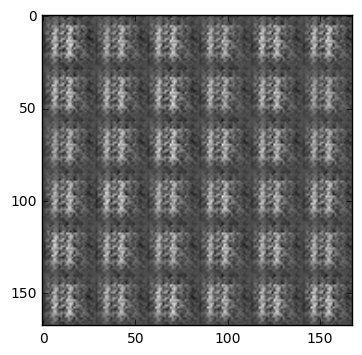

Epoch 0/2... Discriminator Loss: 0.2215... Generator Loss: 2.1907
Epoch 0/2... Discriminator Loss: 0.1912... Generator Loss: 2.5399
Epoch 0/2... Discriminator Loss: 0.0952... Generator Loss: 2.8731
Epoch 0/2... Discriminator Loss: 0.2000... Generator Loss: 2.2889
Epoch 0/2... Discriminator Loss: 0.5193... Generator Loss: 1.8235


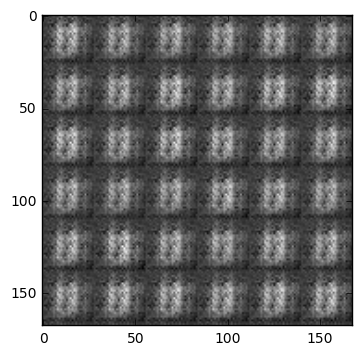

Epoch 0/2... Discriminator Loss: 0.2999... Generator Loss: 1.9744
Epoch 0/2... Discriminator Loss: 0.3284... Generator Loss: 2.0459
Epoch 0/2... Discriminator Loss: 0.3732... Generator Loss: 1.9925
Epoch 0/2... Discriminator Loss: 0.1603... Generator Loss: 2.6682
Epoch 0/2... Discriminator Loss: 0.1297... Generator Loss: 2.7626


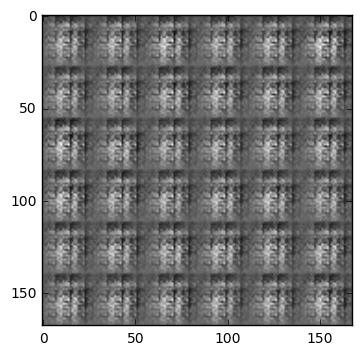

Epoch 0/2... Discriminator Loss: 0.1242... Generator Loss: 2.9009
Epoch 0/2... Discriminator Loss: 0.1333... Generator Loss: 2.8911
Epoch 0/2... Discriminator Loss: 0.1256... Generator Loss: 2.7732
Epoch 0/2... Discriminator Loss: 0.1705... Generator Loss: 2.5069
Epoch 0/2... Discriminator Loss: 0.0817... Generator Loss: 2.9596


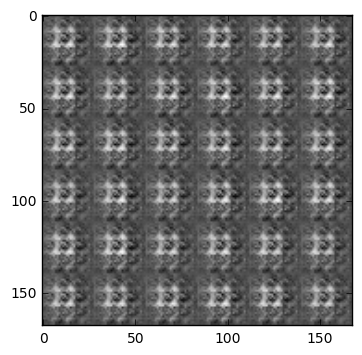

Epoch 0/2... Discriminator Loss: 0.1873... Generator Loss: 2.8030
Epoch 0/2... Discriminator Loss: 0.2084... Generator Loss: 2.3199
Epoch 0/2... Discriminator Loss: 0.1330... Generator Loss: 2.8059
Epoch 0/2... Discriminator Loss: 0.1171... Generator Loss: 2.9091
Epoch 0/2... Discriminator Loss: 0.1432... Generator Loss: 2.7308


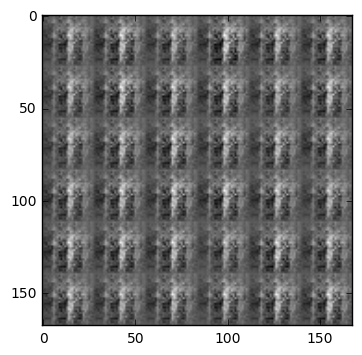

Epoch 0/2... Discriminator Loss: 0.0917... Generator Loss: 3.0954
Epoch 0/2... Discriminator Loss: 0.2178... Generator Loss: 2.2856
Epoch 0/2... Discriminator Loss: 0.2443... Generator Loss: 2.4745
Epoch 0/2... Discriminator Loss: 0.2006... Generator Loss: 2.4152
Epoch 0/2... Discriminator Loss: 0.1433... Generator Loss: 2.7522


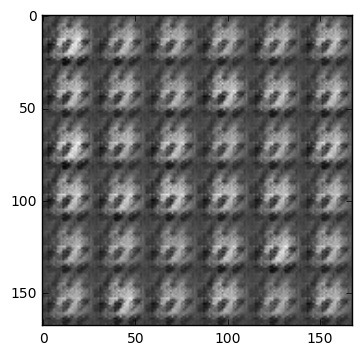

Epoch 0/2... Discriminator Loss: 0.0856... Generator Loss: 3.4809
Epoch 0/2... Discriminator Loss: 0.1185... Generator Loss: 2.9963
Epoch 0/2... Discriminator Loss: 0.1531... Generator Loss: 2.5732
Epoch 0/2... Discriminator Loss: 0.2212... Generator Loss: 2.6528
Epoch 0/2... Discriminator Loss: 0.1321... Generator Loss: 3.0776


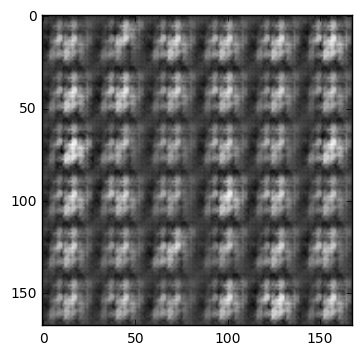

Epoch 0/2... Discriminator Loss: 0.0996... Generator Loss: 3.2681
Epoch 0/2... Discriminator Loss: 0.2975... Generator Loss: 2.0208
Epoch 0/2... Discriminator Loss: 0.2058... Generator Loss: 2.5902
Epoch 0/2... Discriminator Loss: 0.1596... Generator Loss: 2.9261
Epoch 0/2... Discriminator Loss: 0.2415... Generator Loss: 2.2595


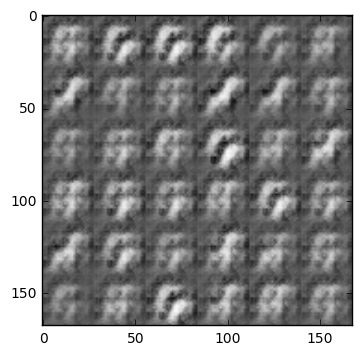

Epoch 0/2... Discriminator Loss: 0.3421... Generator Loss: 1.8383
Epoch 0/2... Discriminator Loss: 0.2273... Generator Loss: 2.3172
Epoch 0/2... Discriminator Loss: 0.2589... Generator Loss: 2.3151
Epoch 0/2... Discriminator Loss: 0.2977... Generator Loss: 2.0708
Epoch 0/2... Discriminator Loss: 0.1832... Generator Loss: 2.6419


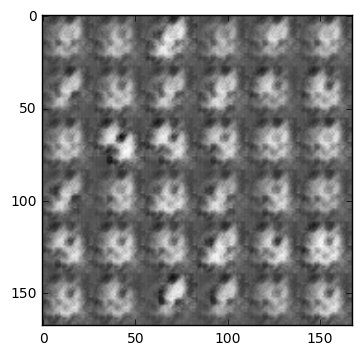

Epoch 0/2... Discriminator Loss: 0.1496... Generator Loss: 2.9737
Epoch 0/2... Discriminator Loss: 0.1399... Generator Loss: 2.4911
Epoch 0/2... Discriminator Loss: 0.2264... Generator Loss: 2.4129
Epoch 0/2... Discriminator Loss: 0.2940... Generator Loss: 2.3402
Epoch 0/2... Discriminator Loss: 0.2889... Generator Loss: 2.2107


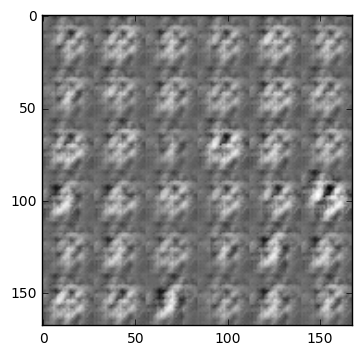

Epoch 0/2... Discriminator Loss: 0.3801... Generator Loss: 1.9924
Epoch 0/2... Discriminator Loss: 0.3697... Generator Loss: 2.4123
Epoch 0/2... Discriminator Loss: 0.1562... Generator Loss: 2.7681
Epoch 0/2... Discriminator Loss: 0.2949... Generator Loss: 2.3139
Epoch 0/2... Discriminator Loss: 0.3764... Generator Loss: 1.9191


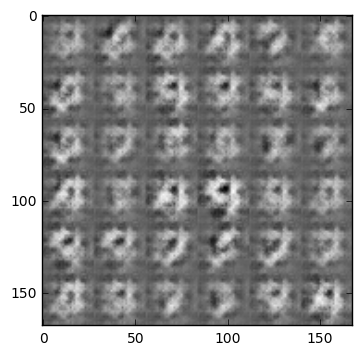

Epoch 0/2... Discriminator Loss: 0.4128... Generator Loss: 2.5024
Epoch 0/2... Discriminator Loss: 0.5823... Generator Loss: 1.2535
Epoch 0/2... Discriminator Loss: 0.4800... Generator Loss: 2.8205
Epoch 0/2... Discriminator Loss: 0.2797... Generator Loss: 2.4019
Epoch 0/2... Discriminator Loss: 0.5172... Generator Loss: 1.3458


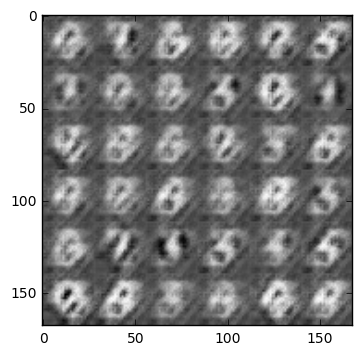

Epoch 0/2... Discriminator Loss: 0.2993... Generator Loss: 2.1013
Epoch 0/2... Discriminator Loss: 0.4719... Generator Loss: 1.6664
Epoch 0/2... Discriminator Loss: 0.7117... Generator Loss: 1.2535
Epoch 0/2... Discriminator Loss: 0.4127... Generator Loss: 1.9943
Epoch 0/2... Discriminator Loss: 0.3118... Generator Loss: 2.1867


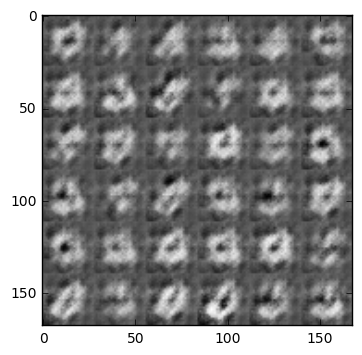

Epoch 0/2... Discriminator Loss: 0.4568... Generator Loss: 1.8980
Epoch 0/2... Discriminator Loss: 0.2406... Generator Loss: 2.4323
Epoch 0/2... Discriminator Loss: 0.3797... Generator Loss: 1.9728
Epoch 0/2... Discriminator Loss: 0.3297... Generator Loss: 2.5255
Epoch 0/2... Discriminator Loss: 0.2949... Generator Loss: 2.2500


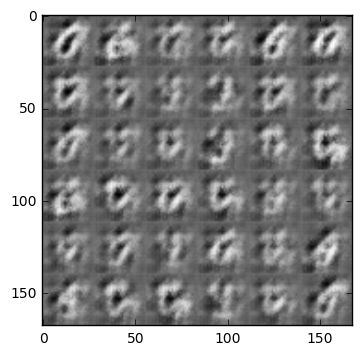

Epoch 0/2... Discriminator Loss: 0.4425... Generator Loss: 1.7982
Epoch 0/2... Discriminator Loss: 0.4532... Generator Loss: 1.5910
Epoch 0/2... Discriminator Loss: 0.6600... Generator Loss: 1.1617
Epoch 0/2... Discriminator Loss: 0.4923... Generator Loss: 2.1836
Epoch 0/2... Discriminator Loss: 0.3596... Generator Loss: 1.9782


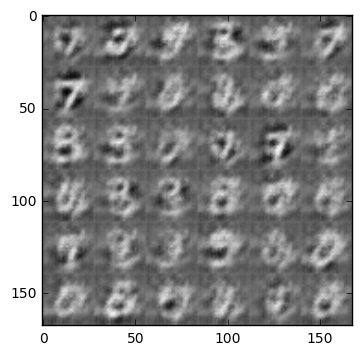

Epoch 0/2... Discriminator Loss: 0.3765... Generator Loss: 2.0056
Epoch 0/2... Discriminator Loss: 0.5469... Generator Loss: 1.5941
Epoch 0/2... Discriminator Loss: 0.6591... Generator Loss: 1.1585
Epoch 0/2... Discriminator Loss: 0.5044... Generator Loss: 1.6331
Epoch 0/2... Discriminator Loss: 0.5564... Generator Loss: 2.0043


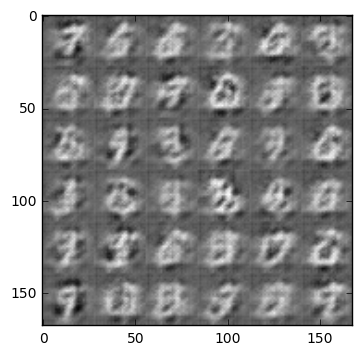

Epoch 0/2... Discriminator Loss: 0.5458... Generator Loss: 1.4430
Epoch 0/2... Discriminator Loss: 0.7595... Generator Loss: 1.1474
Epoch 0/2... Discriminator Loss: 0.6141... Generator Loss: 1.1925
Epoch 1/2... Discriminator Loss: 0.8074... Generator Loss: 1.5277
Epoch 1/2... Discriminator Loss: 0.8219... Generator Loss: 1.0164


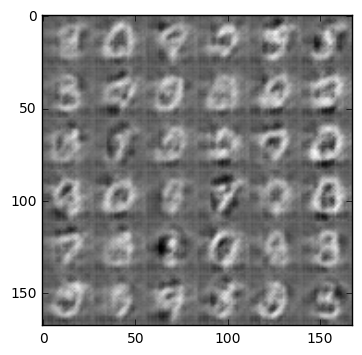

Epoch 1/2... Discriminator Loss: 0.4094... Generator Loss: 1.8320
Epoch 1/2... Discriminator Loss: 0.7580... Generator Loss: 2.0521
Epoch 1/2... Discriminator Loss: 0.9090... Generator Loss: 1.2528
Epoch 1/2... Discriminator Loss: 0.7745... Generator Loss: 1.5419
Epoch 1/2... Discriminator Loss: 0.8461... Generator Loss: 1.4375


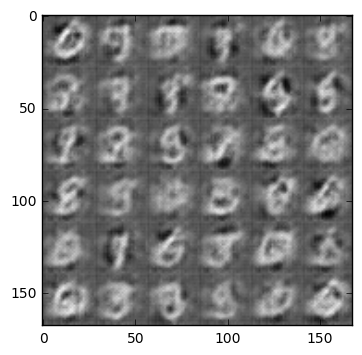

Epoch 1/2... Discriminator Loss: 0.6121... Generator Loss: 1.8665
Epoch 1/2... Discriminator Loss: 0.5548... Generator Loss: 1.5451
Epoch 1/2... Discriminator Loss: 0.8440... Generator Loss: 0.9400
Epoch 1/2... Discriminator Loss: 0.6922... Generator Loss: 1.3300
Epoch 1/2... Discriminator Loss: 0.6424... Generator Loss: 1.4825


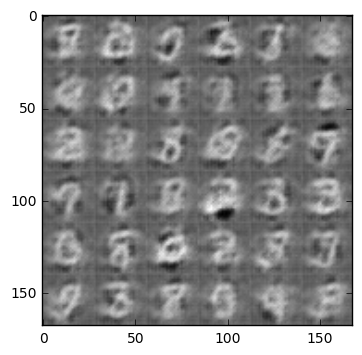

Epoch 1/2... Discriminator Loss: 0.8068... Generator Loss: 1.1238
Epoch 1/2... Discriminator Loss: 0.7262... Generator Loss: 1.1252
Epoch 1/2... Discriminator Loss: 0.7160... Generator Loss: 1.3478
Epoch 1/2... Discriminator Loss: 0.6592... Generator Loss: 1.3250
Epoch 1/2... Discriminator Loss: 0.6743... Generator Loss: 1.4859


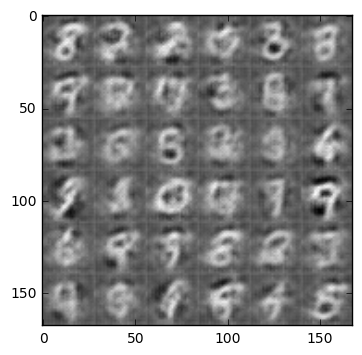

Epoch 1/2... Discriminator Loss: 0.7906... Generator Loss: 1.1396
Epoch 1/2... Discriminator Loss: 0.8494... Generator Loss: 0.9252
Epoch 1/2... Discriminator Loss: 0.9197... Generator Loss: 0.6772
Epoch 1/2... Discriminator Loss: 0.8626... Generator Loss: 1.1720
Epoch 1/2... Discriminator Loss: 0.6594... Generator Loss: 1.1441


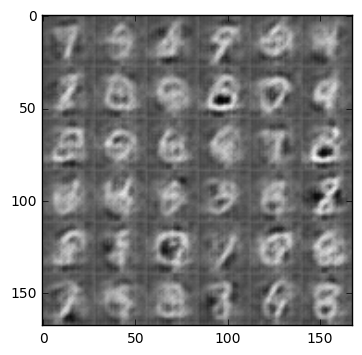

Epoch 1/2... Discriminator Loss: 0.7491... Generator Loss: 1.7764
Epoch 1/2... Discriminator Loss: 0.9264... Generator Loss: 0.7634
Epoch 1/2... Discriminator Loss: 0.7613... Generator Loss: 1.7020
Epoch 1/2... Discriminator Loss: 0.7997... Generator Loss: 1.2288
Epoch 1/2... Discriminator Loss: 0.9532... Generator Loss: 0.8930


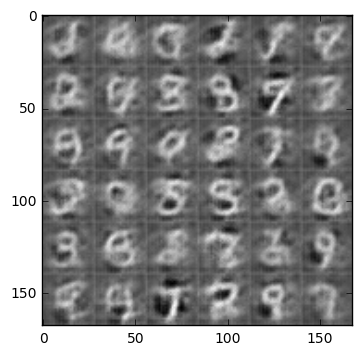

Epoch 1/2... Discriminator Loss: 0.9568... Generator Loss: 0.7266
Epoch 1/2... Discriminator Loss: 0.8105... Generator Loss: 1.0770
Epoch 1/2... Discriminator Loss: 0.7822... Generator Loss: 1.2895
Epoch 1/2... Discriminator Loss: 0.7371... Generator Loss: 1.1045
Epoch 1/2... Discriminator Loss: 0.8407... Generator Loss: 0.8967


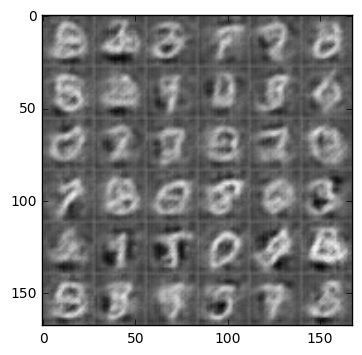

Epoch 1/2... Discriminator Loss: 0.8535... Generator Loss: 1.1013
Epoch 1/2... Discriminator Loss: 0.7250... Generator Loss: 1.2942
Epoch 1/2... Discriminator Loss: 0.6529... Generator Loss: 1.5722
Epoch 1/2... Discriminator Loss: 0.7840... Generator Loss: 1.0331
Epoch 1/2... Discriminator Loss: 0.8731... Generator Loss: 1.2263


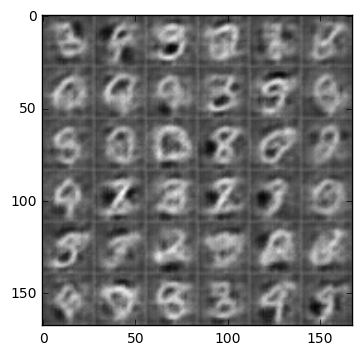

Epoch 1/2... Discriminator Loss: 0.8748... Generator Loss: 0.8058
Epoch 1/2... Discriminator Loss: 0.8775... Generator Loss: 0.9435
Epoch 1/2... Discriminator Loss: 0.7776... Generator Loss: 0.9393
Epoch 1/2... Discriminator Loss: 0.9525... Generator Loss: 0.8482
Epoch 1/2... Discriminator Loss: 0.7044... Generator Loss: 1.1530


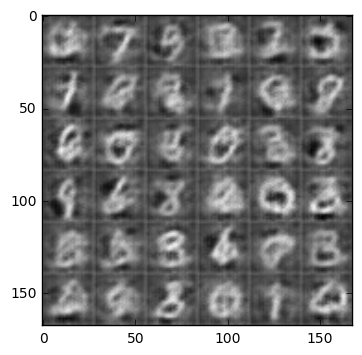

Epoch 1/2... Discriminator Loss: 0.6440... Generator Loss: 1.1754
Epoch 1/2... Discriminator Loss: 1.0499... Generator Loss: 0.7223
Epoch 1/2... Discriminator Loss: 0.7114... Generator Loss: 1.1546
Epoch 1/2... Discriminator Loss: 0.8567... Generator Loss: 0.9701
Epoch 1/2... Discriminator Loss: 0.7638... Generator Loss: 0.9630


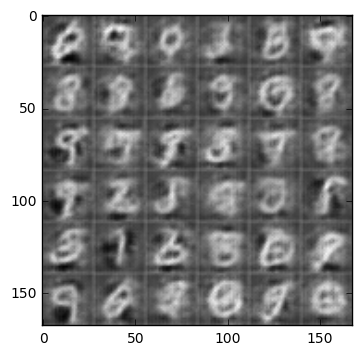

Epoch 1/2... Discriminator Loss: 0.7209... Generator Loss: 1.0201
Epoch 1/2... Discriminator Loss: 0.8205... Generator Loss: 0.8640
Epoch 1/2... Discriminator Loss: 0.8623... Generator Loss: 0.9409
Epoch 1/2... Discriminator Loss: 0.7339... Generator Loss: 1.0965
Epoch 1/2... Discriminator Loss: 0.8267... Generator Loss: 0.7963


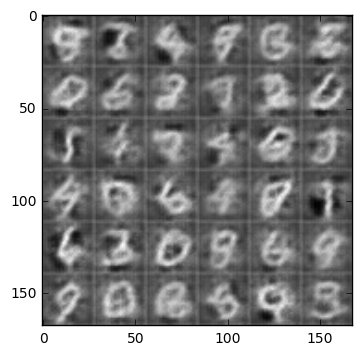

Epoch 1/2... Discriminator Loss: 0.6574... Generator Loss: 1.3214
Epoch 1/2... Discriminator Loss: 0.9096... Generator Loss: 0.8819
Epoch 1/2... Discriminator Loss: 0.6837... Generator Loss: 1.3721
Epoch 1/2... Discriminator Loss: 0.7386... Generator Loss: 1.1312
Epoch 1/2... Discriminator Loss: 0.8507... Generator Loss: 1.1802


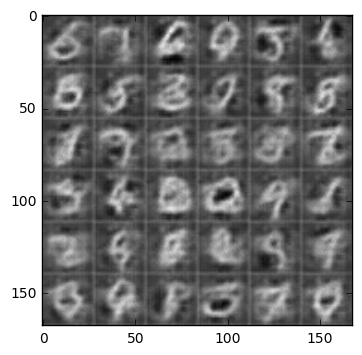

Epoch 1/2... Discriminator Loss: 0.8537... Generator Loss: 0.9041
Epoch 1/2... Discriminator Loss: 0.9396... Generator Loss: 0.6520
Epoch 1/2... Discriminator Loss: 0.8014... Generator Loss: 1.0574
Epoch 1/2... Discriminator Loss: 0.7324... Generator Loss: 1.1651
Epoch 1/2... Discriminator Loss: 0.6372... Generator Loss: 1.3157


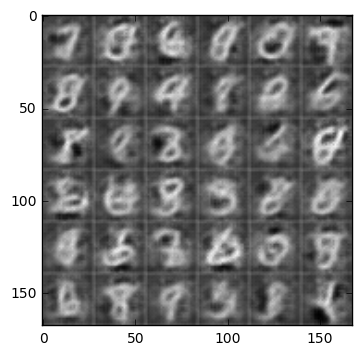

Epoch 1/2... Discriminator Loss: 0.8009... Generator Loss: 1.0309
Epoch 1/2... Discriminator Loss: 1.0659... Generator Loss: 0.6935
Epoch 1/2... Discriminator Loss: 0.9116... Generator Loss: 0.7929
Epoch 1/2... Discriminator Loss: 0.7338... Generator Loss: 1.2243
Epoch 1/2... Discriminator Loss: 0.7489... Generator Loss: 1.0475


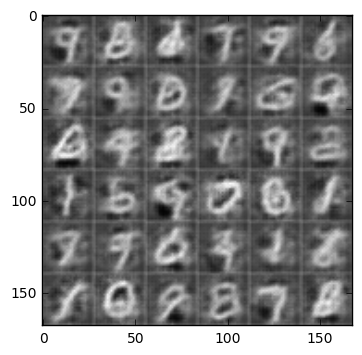

Epoch 1/2... Discriminator Loss: 0.7050... Generator Loss: 1.0945
Epoch 1/2... Discriminator Loss: 0.6967... Generator Loss: 1.3753
Epoch 1/2... Discriminator Loss: 0.7452... Generator Loss: 1.1471
Epoch 1/2... Discriminator Loss: 0.7634... Generator Loss: 0.9780
Epoch 1/2... Discriminator Loss: 0.8488... Generator Loss: 1.5890


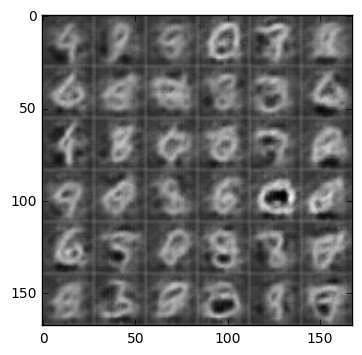

Epoch 1/2... Discriminator Loss: 1.0403... Generator Loss: 0.6369
Epoch 1/2... Discriminator Loss: 0.7287... Generator Loss: 1.3806
Epoch 1/2... Discriminator Loss: 0.7426... Generator Loss: 1.0502
Epoch 1/2... Discriminator Loss: 0.7395... Generator Loss: 0.8858
Epoch 1/2... Discriminator Loss: 0.8219... Generator Loss: 1.0661


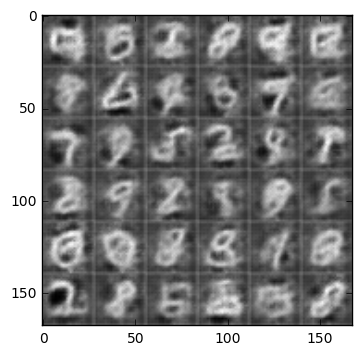

Epoch 1/2... Discriminator Loss: 0.5748... Generator Loss: 1.6387
Epoch 1/2... Discriminator Loss: 1.0517... Generator Loss: 0.6363
Epoch 1/2... Discriminator Loss: 0.7429... Generator Loss: 1.0786
Epoch 1/2... Discriminator Loss: 1.2737... Generator Loss: 0.4714
Epoch 1/2... Discriminator Loss: 0.7069... Generator Loss: 1.0473


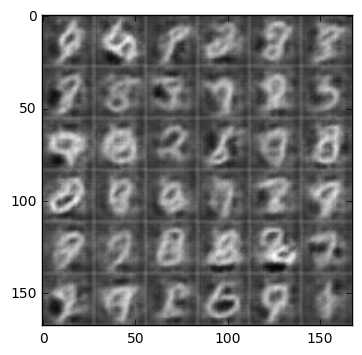

Epoch 1/2... Discriminator Loss: 1.0666... Generator Loss: 0.5461
Epoch 1/2... Discriminator Loss: 0.6768... Generator Loss: 1.1675
Epoch 1/2... Discriminator Loss: 0.7004... Generator Loss: 1.1205
Epoch 1/2... Discriminator Loss: 0.6066... Generator Loss: 1.4032
Epoch 1/2... Discriminator Loss: 0.7518... Generator Loss: 0.9871


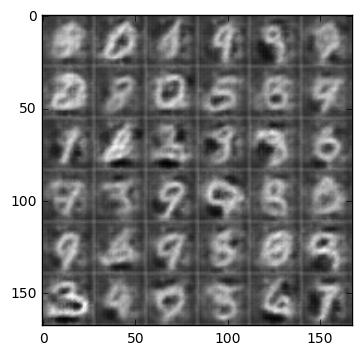

Epoch 1/2... Discriminator Loss: 0.8172... Generator Loss: 1.2458
Epoch 1/2... Discriminator Loss: 0.7420... Generator Loss: 1.1094
Epoch 1/2... Discriminator Loss: 0.8193... Generator Loss: 0.9742
Epoch 1/2... Discriminator Loss: 0.6246... Generator Loss: 1.0958
Epoch 1/2... Discriminator Loss: 0.7200... Generator Loss: 1.0121


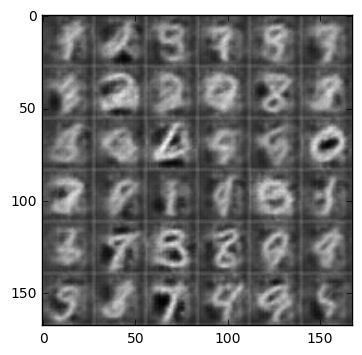

Epoch 1/2... Discriminator Loss: 0.7408... Generator Loss: 0.9082
Epoch 1/2... Discriminator Loss: 0.9194... Generator Loss: 0.7868


In [129]:
batch_size = 32
z_dim = 128
learning_rate = 0.0001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 0/1... Discriminator Loss: 6.7923... Generator Loss: 0.0023


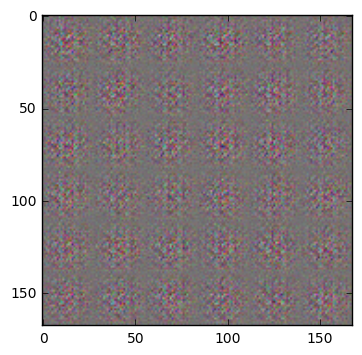

Epoch 0/1... Discriminator Loss: 0.5365... Generator Loss: 1.2969
Epoch 0/1... Discriminator Loss: 0.5659... Generator Loss: 1.0817
Epoch 0/1... Discriminator Loss: 0.2624... Generator Loss: 2.2590
Epoch 0/1... Discriminator Loss: 0.1846... Generator Loss: 2.5408
Epoch 0/1... Discriminator Loss: 0.2152... Generator Loss: 2.3153


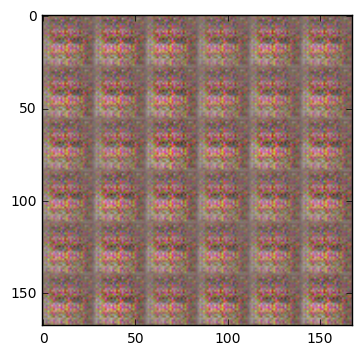

Epoch 0/1... Discriminator Loss: 0.0223... Generator Loss: 7.7544
Epoch 0/1... Discriminator Loss: 0.2764... Generator Loss: 5.6770
Epoch 0/1... Discriminator Loss: 2.4858... Generator Loss: 0.1001
Epoch 0/1... Discriminator Loss: 0.4094... Generator Loss: 4.2030
Epoch 0/1... Discriminator Loss: 0.3582... Generator Loss: 1.3842


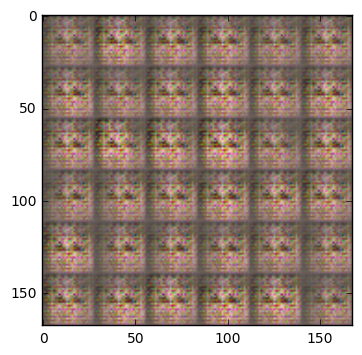

Epoch 0/1... Discriminator Loss: 0.3610... Generator Loss: 3.3459
Epoch 0/1... Discriminator Loss: 0.7889... Generator Loss: 3.1087
Epoch 0/1... Discriminator Loss: 0.7632... Generator Loss: 1.1360
Epoch 0/1... Discriminator Loss: 1.0105... Generator Loss: 4.3347
Epoch 0/1... Discriminator Loss: 1.2376... Generator Loss: 0.8048


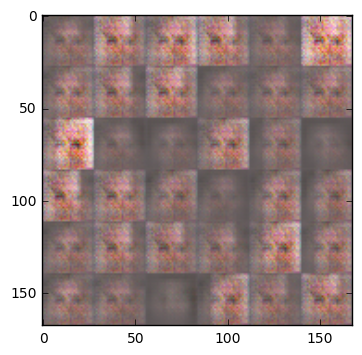

Epoch 0/1... Discriminator Loss: 0.8838... Generator Loss: 2.0076
Epoch 0/1... Discriminator Loss: 1.4276... Generator Loss: 0.7044
Epoch 0/1... Discriminator Loss: 1.1496... Generator Loss: 1.5652
Epoch 0/1... Discriminator Loss: 1.1389... Generator Loss: 1.1345
Epoch 0/1... Discriminator Loss: 1.1648... Generator Loss: 0.8245


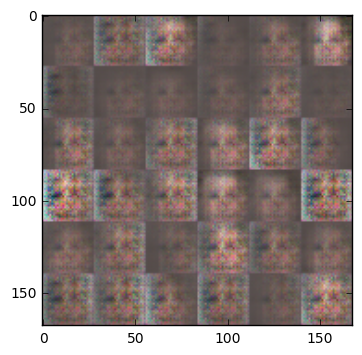

Epoch 0/1... Discriminator Loss: 1.4642... Generator Loss: 1.2577
Epoch 0/1... Discriminator Loss: 1.0894... Generator Loss: 0.9823
Epoch 0/1... Discriminator Loss: 1.2594... Generator Loss: 1.1781
Epoch 0/1... Discriminator Loss: 1.3034... Generator Loss: 0.6034
Epoch 0/1... Discriminator Loss: 1.2014... Generator Loss: 0.7879


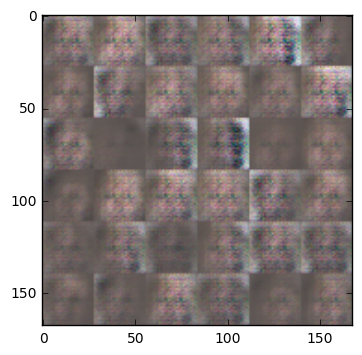

Epoch 0/1... Discriminator Loss: 1.4430... Generator Loss: 0.5895
Epoch 0/1... Discriminator Loss: 1.1864... Generator Loss: 1.3768
Epoch 0/1... Discriminator Loss: 0.9040... Generator Loss: 1.2050
Epoch 0/1... Discriminator Loss: 1.2142... Generator Loss: 0.8498
Epoch 0/1... Discriminator Loss: 0.9893... Generator Loss: 1.1084


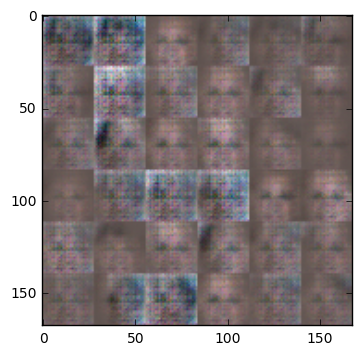

Epoch 0/1... Discriminator Loss: 1.0476... Generator Loss: 1.2497
Epoch 0/1... Discriminator Loss: 1.1462... Generator Loss: 1.0521
Epoch 0/1... Discriminator Loss: 0.8826... Generator Loss: 0.9529
Epoch 0/1... Discriminator Loss: 1.7351... Generator Loss: 0.3296
Epoch 0/1... Discriminator Loss: 1.4118... Generator Loss: 1.1851


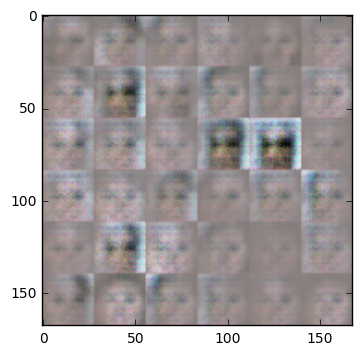

Epoch 0/1... Discriminator Loss: 1.1668... Generator Loss: 1.1344
Epoch 0/1... Discriminator Loss: 1.1160... Generator Loss: 1.1804
Epoch 0/1... Discriminator Loss: 1.2999... Generator Loss: 0.7338
Epoch 0/1... Discriminator Loss: 1.4318... Generator Loss: 0.6113
Epoch 0/1... Discriminator Loss: 0.8455... Generator Loss: 1.1080


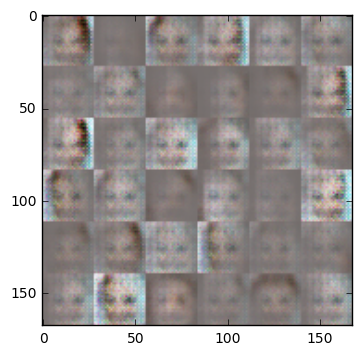

Epoch 0/1... Discriminator Loss: 1.6845... Generator Loss: 0.3229
Epoch 0/1... Discriminator Loss: 0.8442... Generator Loss: 1.4390
Epoch 0/1... Discriminator Loss: 1.0399... Generator Loss: 1.1302
Epoch 0/1... Discriminator Loss: 0.7892... Generator Loss: 1.6650
Epoch 0/1... Discriminator Loss: 0.8045... Generator Loss: 1.7460


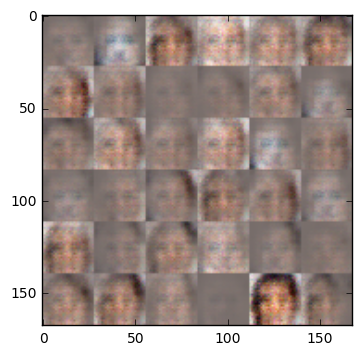

Epoch 0/1... Discriminator Loss: 0.7730... Generator Loss: 1.1013
Epoch 0/1... Discriminator Loss: 1.3449... Generator Loss: 0.5596
Epoch 0/1... Discriminator Loss: 0.9475... Generator Loss: 1.9644
Epoch 0/1... Discriminator Loss: 1.2288... Generator Loss: 1.7012
Epoch 0/1... Discriminator Loss: 0.7272... Generator Loss: 1.7510


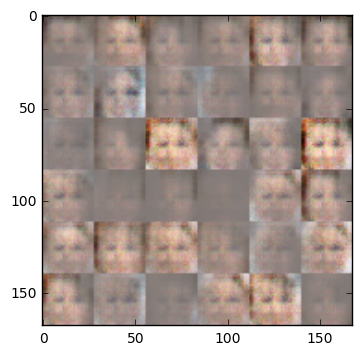

Epoch 0/1... Discriminator Loss: 1.3081... Generator Loss: 0.9744
Epoch 0/1... Discriminator Loss: 1.2404... Generator Loss: 0.8546
Epoch 0/1... Discriminator Loss: 1.2393... Generator Loss: 2.0171
Epoch 0/1... Discriminator Loss: 1.4197... Generator Loss: 0.8431
Epoch 0/1... Discriminator Loss: 1.1634... Generator Loss: 1.0037


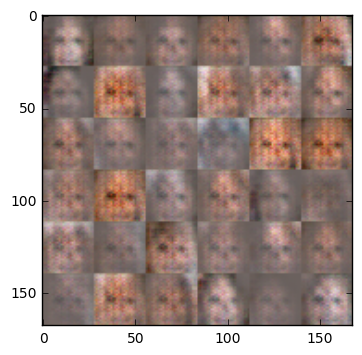

Epoch 0/1... Discriminator Loss: 1.1185... Generator Loss: 1.0964
Epoch 0/1... Discriminator Loss: 1.7127... Generator Loss: 0.7960
Epoch 0/1... Discriminator Loss: 1.0863... Generator Loss: 1.0026
Epoch 0/1... Discriminator Loss: 1.2066... Generator Loss: 1.0466
Epoch 0/1... Discriminator Loss: 1.3338... Generator Loss: 0.7591


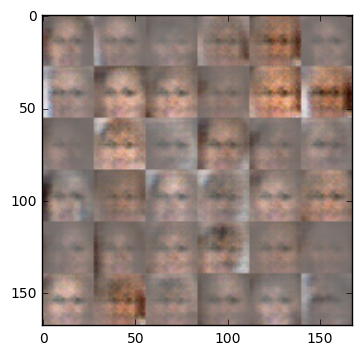

Epoch 0/1... Discriminator Loss: 1.4554... Generator Loss: 0.5117
Epoch 0/1... Discriminator Loss: 1.1633... Generator Loss: 0.9681
Epoch 0/1... Discriminator Loss: 1.2482... Generator Loss: 0.6857
Epoch 0/1... Discriminator Loss: 1.2045... Generator Loss: 1.1218
Epoch 0/1... Discriminator Loss: 1.2194... Generator Loss: 0.8734


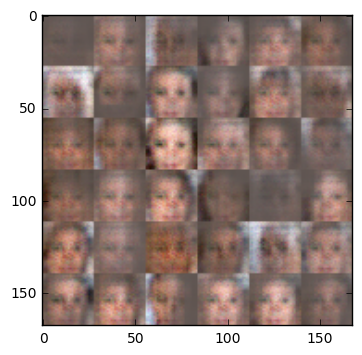

Epoch 0/1... Discriminator Loss: 0.9839... Generator Loss: 1.0818
Epoch 0/1... Discriminator Loss: 0.9410... Generator Loss: 1.0815
Epoch 0/1... Discriminator Loss: 1.4127... Generator Loss: 0.6988
Epoch 0/1... Discriminator Loss: 0.9646... Generator Loss: 1.0162
Epoch 0/1... Discriminator Loss: 1.2428... Generator Loss: 0.9196


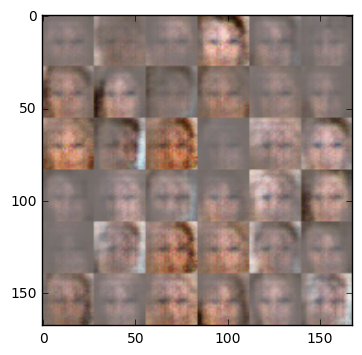

Epoch 0/1... Discriminator Loss: 1.4208... Generator Loss: 0.7364
Epoch 0/1... Discriminator Loss: 1.1647... Generator Loss: 0.9823
Epoch 0/1... Discriminator Loss: 1.3506... Generator Loss: 0.6994
Epoch 0/1... Discriminator Loss: 1.3551... Generator Loss: 0.8688
Epoch 0/1... Discriminator Loss: 1.3414... Generator Loss: 0.9480


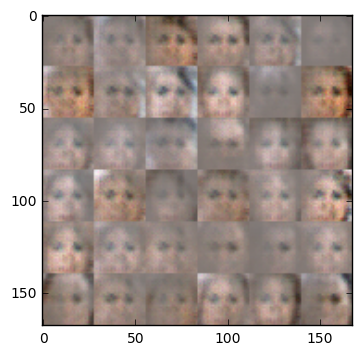

Epoch 0/1... Discriminator Loss: 1.2964... Generator Loss: 0.7563
Epoch 0/1... Discriminator Loss: 1.3791... Generator Loss: 0.7775
Epoch 0/1... Discriminator Loss: 0.9596... Generator Loss: 1.0446
Epoch 0/1... Discriminator Loss: 1.4484... Generator Loss: 0.7500
Epoch 0/1... Discriminator Loss: 1.2928... Generator Loss: 0.8633


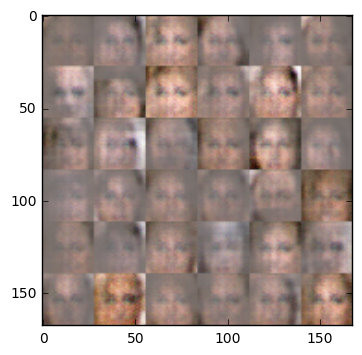

Epoch 0/1... Discriminator Loss: 1.3612... Generator Loss: 0.8559
Epoch 0/1... Discriminator Loss: 1.2683... Generator Loss: 0.8824
Epoch 0/1... Discriminator Loss: 1.3773... Generator Loss: 0.6723
Epoch 0/1... Discriminator Loss: 1.0654... Generator Loss: 0.7914
Epoch 0/1... Discriminator Loss: 1.2394... Generator Loss: 0.9160


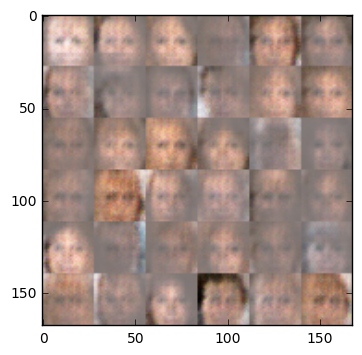

Epoch 0/1... Discriminator Loss: 1.2125... Generator Loss: 0.9332
Epoch 0/1... Discriminator Loss: 1.2311... Generator Loss: 0.6765
Epoch 0/1... Discriminator Loss: 1.1514... Generator Loss: 0.8852
Epoch 0/1... Discriminator Loss: 1.4169... Generator Loss: 0.8394
Epoch 0/1... Discriminator Loss: 1.1813... Generator Loss: 1.4329


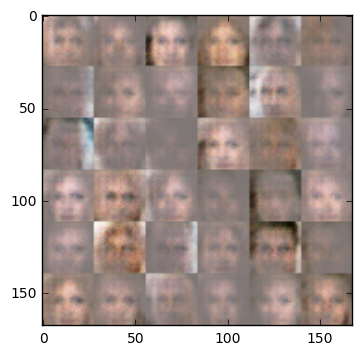

Epoch 0/1... Discriminator Loss: 1.3822... Generator Loss: 0.6682
Epoch 0/1... Discriminator Loss: 1.3098... Generator Loss: 0.7392
Epoch 0/1... Discriminator Loss: 1.2174... Generator Loss: 0.8212
Epoch 0/1... Discriminator Loss: 1.2176... Generator Loss: 0.7881
Epoch 0/1... Discriminator Loss: 1.0942... Generator Loss: 0.9466


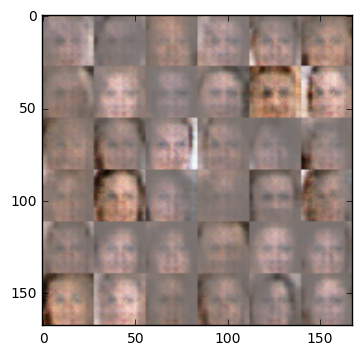

Epoch 0/1... Discriminator Loss: 1.1873... Generator Loss: 0.8149
Epoch 0/1... Discriminator Loss: 1.1280... Generator Loss: 1.1292
Epoch 0/1... Discriminator Loss: 1.4517... Generator Loss: 0.4900
Epoch 0/1... Discriminator Loss: 1.4081... Generator Loss: 0.4681
Epoch 0/1... Discriminator Loss: 1.0634... Generator Loss: 1.1724


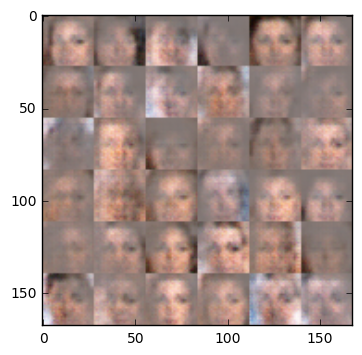

Epoch 0/1... Discriminator Loss: 1.2544... Generator Loss: 0.6915
Epoch 0/1... Discriminator Loss: 1.2618... Generator Loss: 0.8456
Epoch 0/1... Discriminator Loss: 0.9709... Generator Loss: 1.0151
Epoch 0/1... Discriminator Loss: 1.3784... Generator Loss: 0.4471
Epoch 0/1... Discriminator Loss: 0.8635... Generator Loss: 1.1690


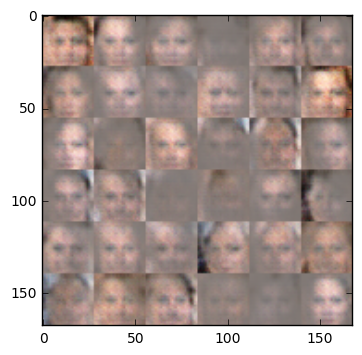

Epoch 0/1... Discriminator Loss: 1.1966... Generator Loss: 0.6649
Epoch 0/1... Discriminator Loss: 1.2937... Generator Loss: 0.6494
Epoch 0/1... Discriminator Loss: 1.4471... Generator Loss: 0.5097
Epoch 0/1... Discriminator Loss: 0.9610... Generator Loss: 1.5731
Epoch 0/1... Discriminator Loss: 1.1579... Generator Loss: 1.5135


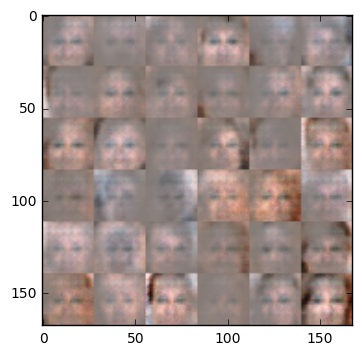

Epoch 0/1... Discriminator Loss: 1.3062... Generator Loss: 1.0305
Epoch 0/1... Discriminator Loss: 0.8682... Generator Loss: 1.2693
Epoch 0/1... Discriminator Loss: 1.3325... Generator Loss: 0.6079
Epoch 0/1... Discriminator Loss: 1.3150... Generator Loss: 0.5972
Epoch 0/1... Discriminator Loss: 1.1116... Generator Loss: 0.9698


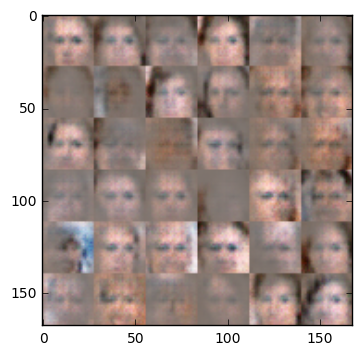

Epoch 0/1... Discriminator Loss: 1.3729... Generator Loss: 0.5244
Epoch 0/1... Discriminator Loss: 1.4024... Generator Loss: 0.5624
Epoch 0/1... Discriminator Loss: 1.1801... Generator Loss: 0.8955
Epoch 0/1... Discriminator Loss: 1.3537... Generator Loss: 0.9071
Epoch 0/1... Discriminator Loss: 1.3258... Generator Loss: 0.8244


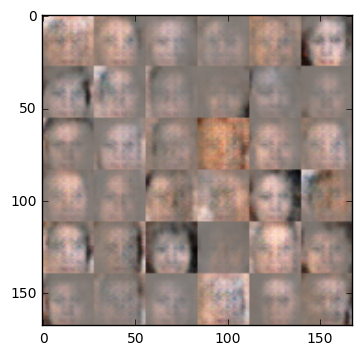

Epoch 0/1... Discriminator Loss: 1.2932... Generator Loss: 0.6764
Epoch 0/1... Discriminator Loss: 1.4254... Generator Loss: 0.6718
Epoch 0/1... Discriminator Loss: 1.2870... Generator Loss: 0.8563
Epoch 0/1... Discriminator Loss: 1.2773... Generator Loss: 0.7369
Epoch 0/1... Discriminator Loss: 1.2091... Generator Loss: 0.8775


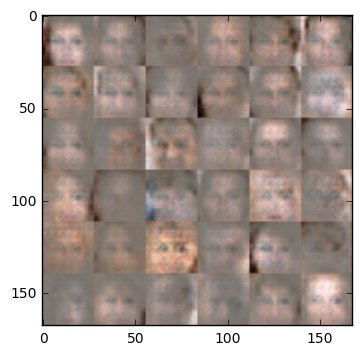

Epoch 0/1... Discriminator Loss: 1.3985... Generator Loss: 0.7126
Epoch 0/1... Discriminator Loss: 1.3284... Generator Loss: 0.7130
Epoch 0/1... Discriminator Loss: 1.3346... Generator Loss: 0.8705
Epoch 0/1... Discriminator Loss: 1.3473... Generator Loss: 0.8105
Epoch 0/1... Discriminator Loss: 1.2757... Generator Loss: 0.9771


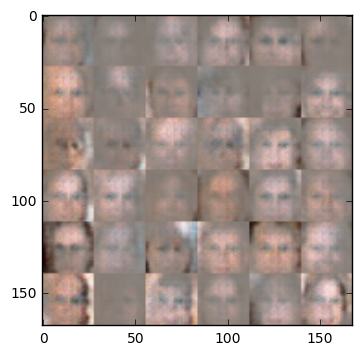

Epoch 0/1... Discriminator Loss: 1.3382... Generator Loss: 0.7456
Epoch 0/1... Discriminator Loss: 1.3744... Generator Loss: 0.7868
Epoch 0/1... Discriminator Loss: 1.1698... Generator Loss: 0.8541
Epoch 0/1... Discriminator Loss: 1.2414... Generator Loss: 0.8142
Epoch 0/1... Discriminator Loss: 1.3250... Generator Loss: 0.6693


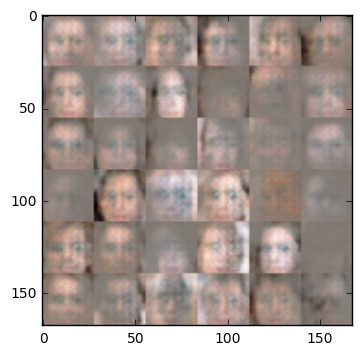

Epoch 0/1... Discriminator Loss: 1.3890... Generator Loss: 0.7531
Epoch 0/1... Discriminator Loss: 1.1362... Generator Loss: 0.8381
Epoch 0/1... Discriminator Loss: 1.3407... Generator Loss: 0.6641
Epoch 0/1... Discriminator Loss: 1.2775... Generator Loss: 0.7176
Epoch 0/1... Discriminator Loss: 1.3184... Generator Loss: 0.6745


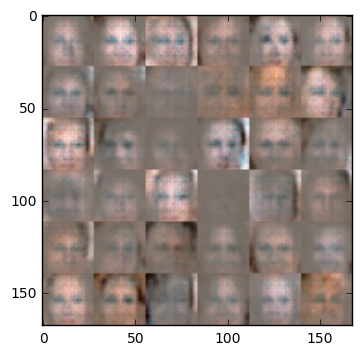

Epoch 0/1... Discriminator Loss: 1.2860... Generator Loss: 0.7098
Epoch 0/1... Discriminator Loss: 1.2952... Generator Loss: 0.6500
Epoch 0/1... Discriminator Loss: 1.2717... Generator Loss: 0.9196
Epoch 0/1... Discriminator Loss: 1.4415... Generator Loss: 0.5601
Epoch 0/1... Discriminator Loss: 1.3302... Generator Loss: 0.7187


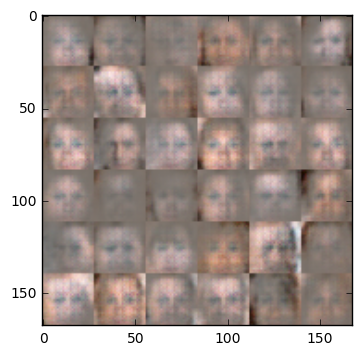

Epoch 0/1... Discriminator Loss: 1.2363... Generator Loss: 0.7651
Epoch 0/1... Discriminator Loss: 1.2971... Generator Loss: 0.6461
Epoch 0/1... Discriminator Loss: 1.2223... Generator Loss: 0.9277
Epoch 0/1... Discriminator Loss: 1.2716... Generator Loss: 0.7442
Epoch 0/1... Discriminator Loss: 1.1271... Generator Loss: 0.7577


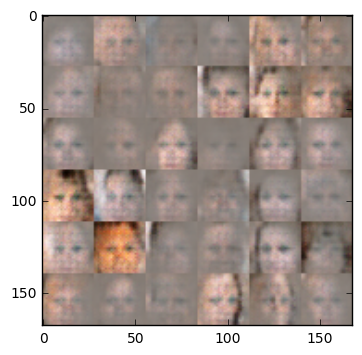

Epoch 0/1... Discriminator Loss: 1.1705... Generator Loss: 0.8019
Epoch 0/1... Discriminator Loss: 1.2709... Generator Loss: 0.7147
Epoch 0/1... Discriminator Loss: 1.1511... Generator Loss: 0.7775
Epoch 0/1... Discriminator Loss: 1.2743... Generator Loss: 0.7047
Epoch 0/1... Discriminator Loss: 1.4277... Generator Loss: 0.7980


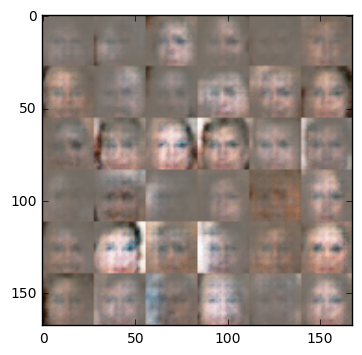

Epoch 0/1... Discriminator Loss: 1.1597... Generator Loss: 0.8273
Epoch 0/1... Discriminator Loss: 1.2472... Generator Loss: 0.8052
Epoch 0/1... Discriminator Loss: 1.2247... Generator Loss: 0.7977


In [132]:
batch_size = 64
z_dim = 128
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.